In [8]:
import sys
import os

# Or use this if the module is in the current directory
# sys.path.append(os.getcwd())

import precompute_kernels
import string_kernel as sk
import jax.random as random
import jax.numpy as jnp
from dataloader import load_data
key = random.PRNGKey(0)
num_features = 1000
kmer_length = 2
random_kmers = sk.sample_random_kmers(key, num_features, kmer_length)

# Load data
_, _, condition_list = load_data()
n_conditions = len(condition_list)

# Create character to integer mapping
atc_chars = set()
for condition in condition_list:
    for drug in condition.drugs:
        for atc in drug.atcs:
            if atc is not None:
                for level in atc:
                    atc_chars.add(str(level))

alphabet = sorted(list(atc_chars))
char2int = {c: i for i, c in enumerate(alphabet)}


In [11]:
len(char2int)

453

In [2]:
cond1 = condition_list[0]
cond2 = condition_list[1]
cond1arr = precompute_kernels.convert_condition_to_array(cond1, char2int)
precompute_kernels.compute_condition_similarity(
    cond1,
    cond2,
    random_kmers,
    char2int
)

Arrays lengths: [4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
k-mer length: 2
Random k-mers range: 0 to 452
Alphabet size: 453
Sample random k-mers (readable): ['459197', '2285', '545636', '275504', '507329']

Processing array 0, length: 4
  Extracted 3 k-mers
  Sample k-mers (readable): ['28252', '252253', '253645']
  Comparing k-mers...
    Array k-mer 0: [124 110] (28252)
      No match with random k-mer 0: [265  68] (459197)
      No match with random k-mer 1: [ 71 125] (2285)
      No match with random k-mer 2: [313 369] (545636)
      No match with random k-mer 3: [120 292] (275504)
      No match with random k-mer 4: [294 170] (507329)
    Array k-mer 1: [110 111] (252253)
      No match with random k-mer 0: [265  68] (459197)
      No match with random k-mer 1: [ 71 125] (2285)
      No match with random k-mer 2: [313 369] (545636)
      No match with random k-mer 3

Array(0., dtype=float32)

In [4]:
cond1

Condition(name=Alcohol dependency, drugs=['82819', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '3554', '7243', '3554', '3554', '3554', '3554', '3554', '82819', '82819', '7243', '7243', '7243', '82819', '7243', '82819', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '7243', '82819', '82819', '82819', '82819', '3554', '82819', '3554'])

In [4]:
def compute_random_features_multiarray(arrays, random_kmers):
    """Compute features for multiple integer arrays"""
    k = random_kmers.shape[1]
    feature_sum = jnp.zeros(random_kmers.shape[0])
    total_windows = 0
    
    for arr in arrays:
        if arr.shape[0] < k:
            continue
        kmers = sk.extract_kmers(arr, k)
        kmers_exp = jnp.expand_dims(kmers, axis=0)
        random_kmers_exp = jnp.expand_dims(random_kmers, axis=1)
        eq = (kmers_exp == random_kmers_exp)
        match = jnp.all(eq, axis=-1)
        counts = jnp.sum(match, axis=-1)
        
        feature_sum += counts
        total_windows += kmers.shape[0]
    
    return jnp.where(total_windows > 0,
                    jnp.sqrt(feature_sum.astype(jnp.float32) / total_windows),
                    jnp.zeros(random_kmers.shape[0]))

In [8]:
result = compute_random_features_multiarray(cond1arr, random_kmers)
k = random_kmers.shape[1]
feature_sum = jnp.zeros(random_kmers.shape[0])
total_windows = 0
    


In [14]:
arr = cond1arr[0]
kmers = sk.extract_kmers(arr, 2)
kmers

Array([[124, 110],
       [110, 111],
       [111, 373]], dtype=int32)

In [ ]:
for arr in arrays:
    if arr.shape[0] < k:
        continue
    kmers = sk.extract_kmers(arr, k)
    kmers_exp = jnp.expand_dims(kmers, axis=0)
    random_kmers_exp = jnp.expand_dims(random_kmers, axis=1)
    eq = (kmers_exp == random_kmers_exp)
    match = jnp.all(eq, axis=-1)
    counts = jnp.sum(match, axis=-1)
    
    feature_sum += counts
    total_windows += kmers.shape[0]

jnp.where(total_windows > 0,
                jnp.sqrt(feature_sum.astype(jnp.float32) / total_windows),
                jnp.zeros(random_kmers.shape[0]))

Available arrays in the file: ['kernel_matrix', 'condition_list']


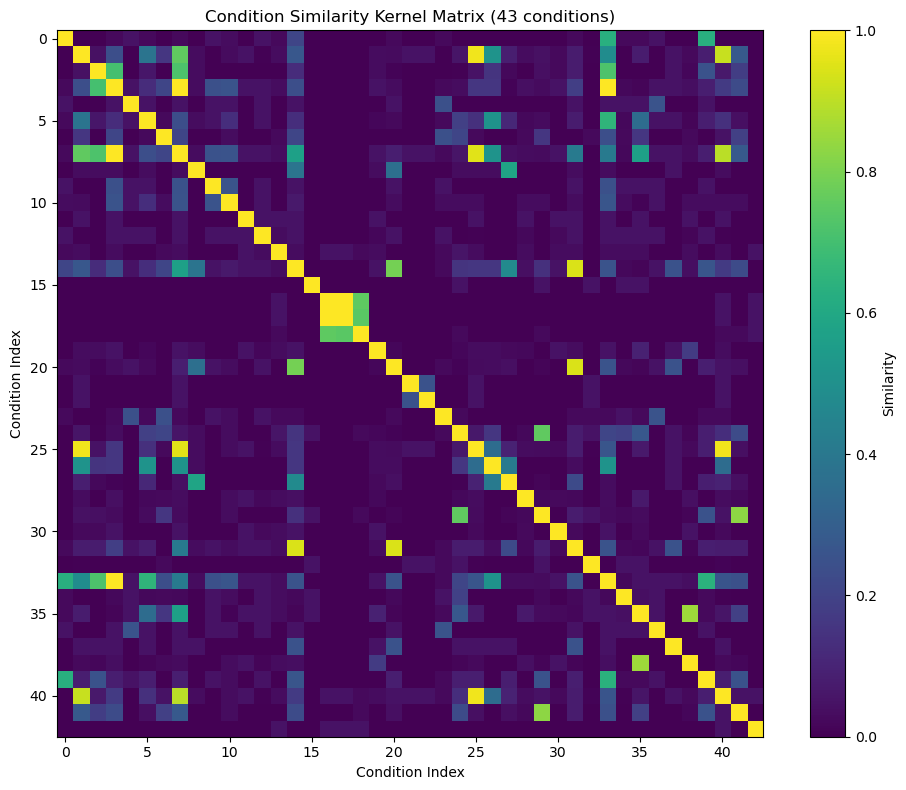

In [9]:
import numpy as np

import matplotlib.pyplot as plt

# Load the precomputed kernel matrix
kernel_matrix = np.load('Data/condition_kernel_matrix.npz')

# Access the data in the npz file
# If it's a single array, it might be stored with a key like 'arr_0'
# If it has named arrays, we can print the available keys
print("Available arrays in the file:", list(kernel_matrix.keys()))

# Let's extract and visualize the main kernel matrix (assuming it's named 'kernel' or similar)
# Adjust the key name if needed based on what's in the file
if 'kernel_matrix' in kernel_matrix:
    condition_kernel = kernel_matrix['kernel_matrix']
    
    # Plot the kernel matrix as a heatmap
    plt.figure(figsize=(10, 8))
    plt.imshow(condition_kernel, cmap='viridis')
    plt.colorbar(label='Similarity')
    plt.title(f'Condition Similarity Kernel Matrix ({n_conditions} conditions)')
    plt.xlabel('Condition Index')
    plt.ylabel('Condition Index')
    plt.tight_layout()
    plt.show()

In [10]:
# Calculate the percentage of zeros in the kernel matrix
zeros_count = (condition_kernel == 0).sum()
total_elements = condition_kernel.size
percentage_zeros = (zeros_count / total_elements) * 100

print(f"Percentage of zeros in the kernel matrix: {percentage_zeros:.2f}%")

Percentage of zeros in the kernel matrix: 49.11%
